In [4]:
import numpy as np
import matplotlib.pyplot as plt
import iDEA
import ipywidgets as widgets
from IPython.display import display
import pickle
import time
from pathlib import Path
import collections_iDEA
import collections_iDEA.multiplets as mm
import os
import scipy.special as sp

# Initialize the system
points = 231
l = 10
x = np.linspace(-l, l, points)
dx = x[1] - x[0]
omega = 0.3275
v_ext = 0.5 * omega**2 * (x**2)
v_int = np.zeros([len(x), len(x)])
qho_single = iDEA.system.System(x, v_ext, v_int, electrons="u")
qho_double = iDEA.system.System(x, v_ext, v_int, electrons="ud")

states_small_int = {}
states_zero_int = {}
occupied_info = []

directory = Path("states")

# for i in range(0, 1):
#     file_path = directory / f"qho_small_int_state_{i}_1e-11.pkl"
#     try:
#         with file_path.open("rb") as file:
#             states_small_int[i] = pickle.load(file)
#     except FileNotFoundError:
#         print(f"File state_{i}.pkl not found.")
#     except Exception as e:
#         print(f"An error occurred while loading state_{i}.pkl: {e}")

max_k = 188

iDEA_collection = collections_iDEA.CollectionOfStates(max_k)
energy_array = np.zeros(max_k)

for i in range(max_k):
    file_path = directory / f"qho_zero_int_state_{i}.pkl"
    try:
        with file_path.open("rb") as file:
            state = pickle.load(file)
            iDEA_collection.add_state_class(state)
            energy_array[i] = state.energy
    except FileNotFoundError:
        print(f"File state_{i}.pkl not found.")
    except Exception as e:
        print(f"An error occurred while loading state_{i}.pkl: {e}")

iDEA_collection.add_energies(energy_array)

# file_path = "occupied_info_231.pkl"
# with open(file_path, "rb") as file:
#     occupied_info = pickle.load(file)

def qho_energy(index):
    return omega*(index + 0.5)

index_list = mm.apply_energy_method(qho_energy, qho_double, max_k, second_mask=False)
index_list.calculate_multiplets()

for i in range(len(index_list.up_indices)):

    print(f"Analytic State {i}, First Index: {index_list.up_indices[i]}, Second Index: {index_list.down_indices[i]}, Energy: {index_list.energies[i]}")

print(f"Multiplets: {index_list.multiplets}")

File indices_up_to_20.pkl exists
Elapsed Time = 0.0017264989983232226
Analytic State 0, First Index: 0, Second Index: 0, Energy: 0.3275
Analytic State 1, First Index: 0, Second Index: 1, Energy: 0.655
Analytic State 2, First Index: 1, Second Index: 0, Energy: 0.655
Analytic State 3, First Index: 1, Second Index: 1, Energy: 0.9825
Analytic State 4, First Index: 0, Second Index: 2, Energy: 0.9825000000000002
Analytic State 5, First Index: 2, Second Index: 0, Energy: 0.9825000000000002
Analytic State 6, First Index: 0, Second Index: 3, Energy: 1.31
Analytic State 7, First Index: 1, Second Index: 2, Energy: 1.31
Analytic State 8, First Index: 2, Second Index: 1, Energy: 1.31
Analytic State 9, First Index: 3, Second Index: 0, Energy: 1.31
Analytic State 10, First Index: 1, Second Index: 3, Energy: 1.6375
Analytic State 11, First Index: 3, Second Index: 1, Energy: 1.6375
Analytic State 12, First Index: 0, Second Index: 4, Energy: 1.6375000000000002
Analytic State 13, First Index: 2, Second I

In [5]:
analytic_prob_densities = []

def wave_function(index, omega, x):
    exponent = -(omega * (x**2)) / (2)
    t = np.sqrt(1 / ((2**index) * sp.factorial(index))) * pow((omega/np.pi), 0.25) * np.exp(exponent) * sp.eval_hermite(index, np.sqrt(omega)*x)

    return t

for i in range(max_k):
    index_k = index_list.up_indices[i]
    index_j = index_list.down_indices[i]

    pd_analytic_1 = (np.abs(wave_function(index_k, omega, x)))**2 + (np.abs(wave_function(index_j, omega, x)))**2
    analytic_prob_densities.append(pd_analytic_1)

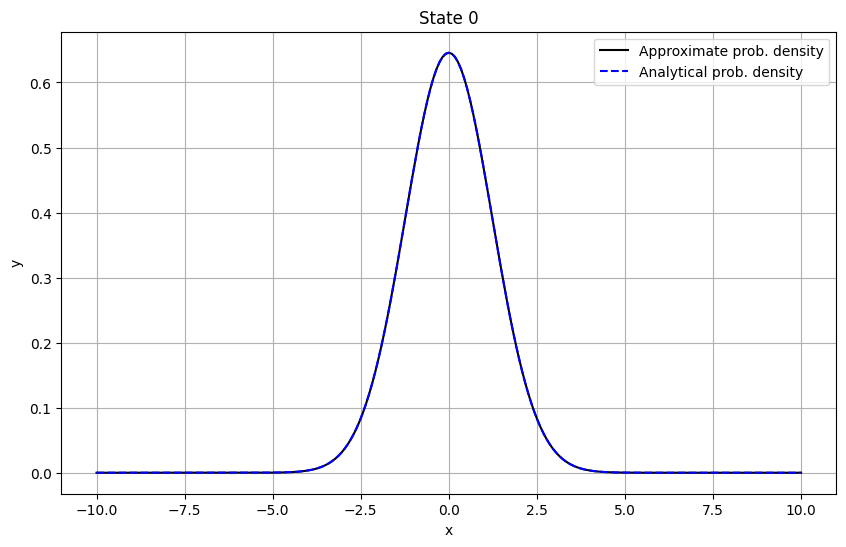

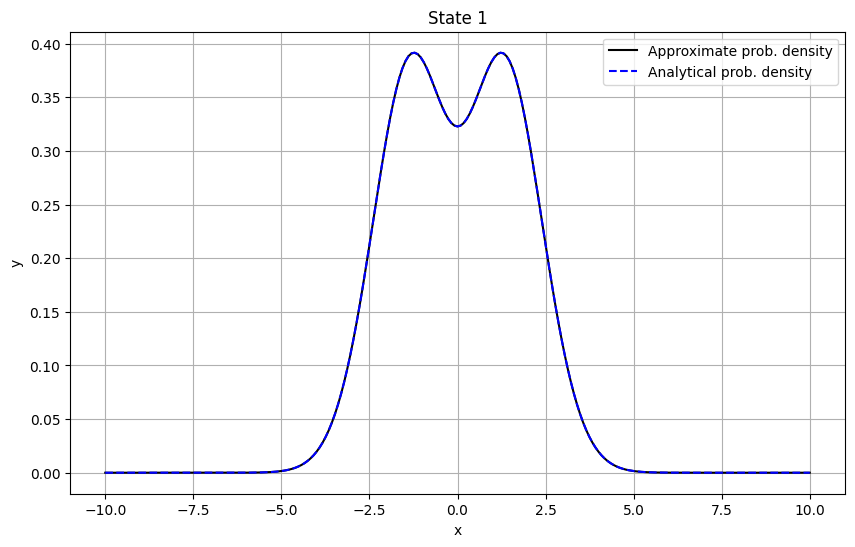

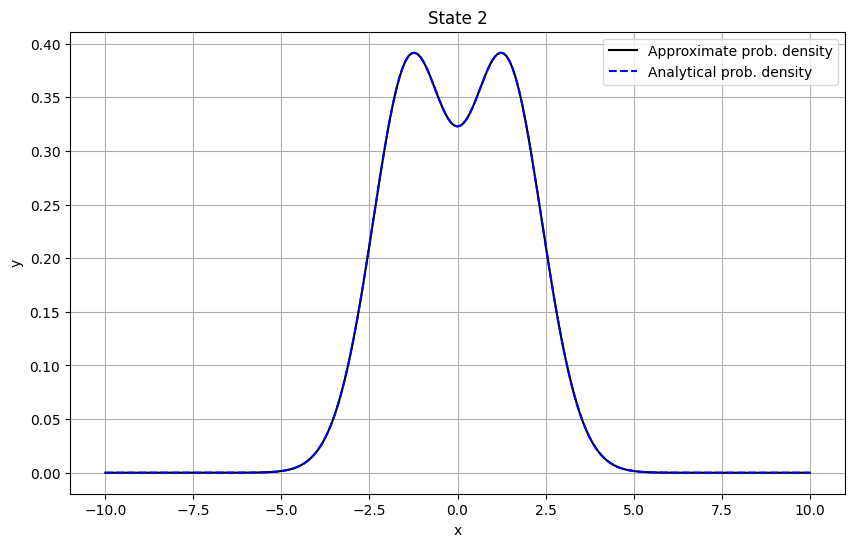

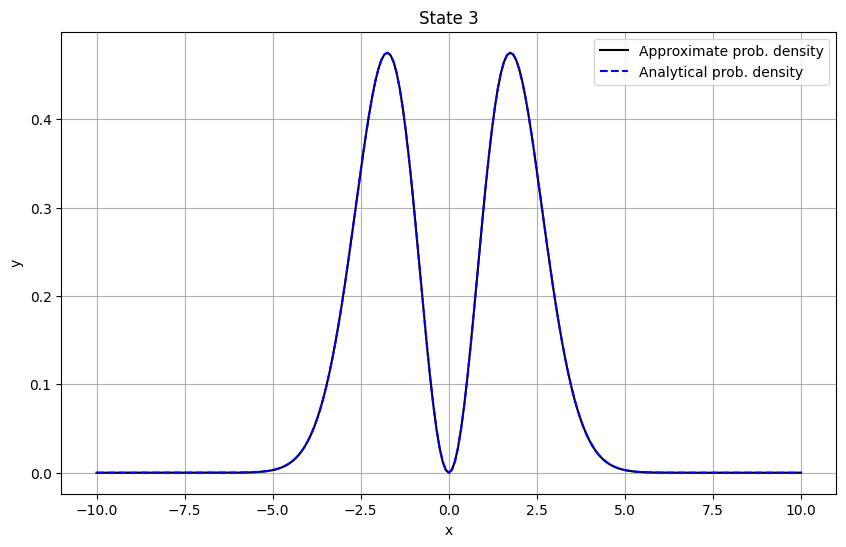

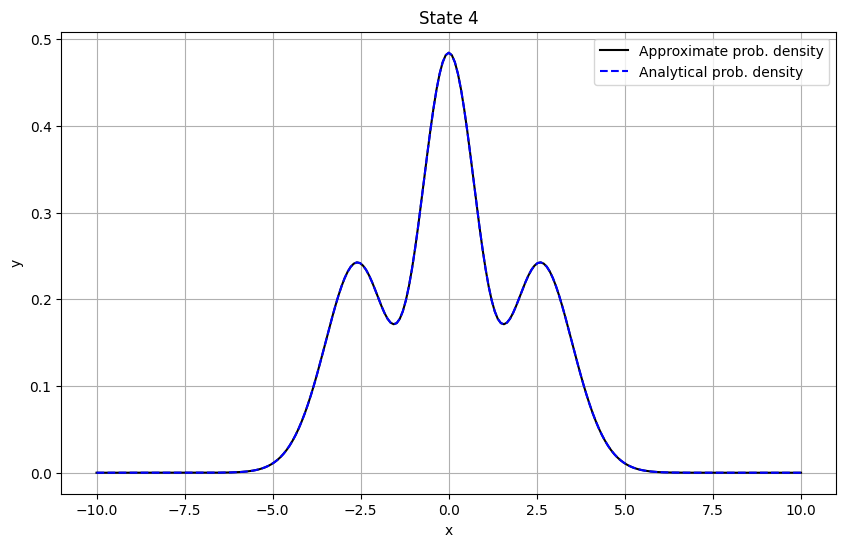

...

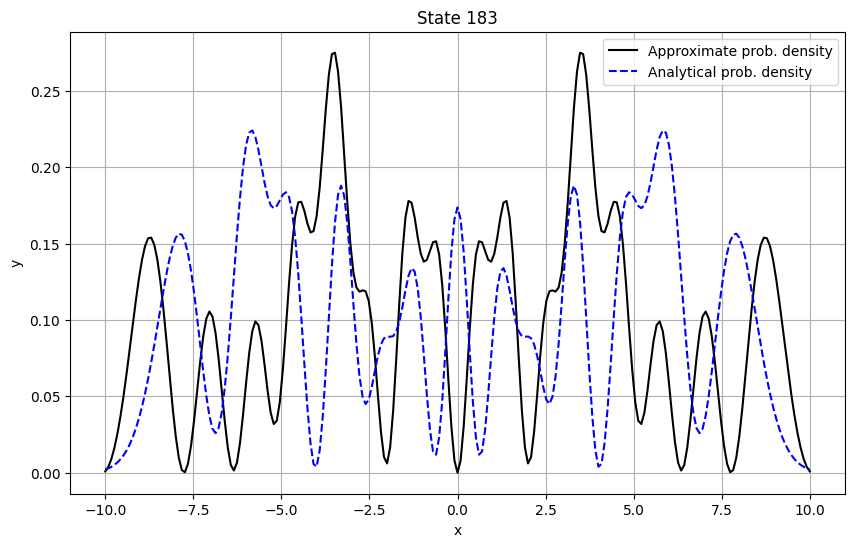

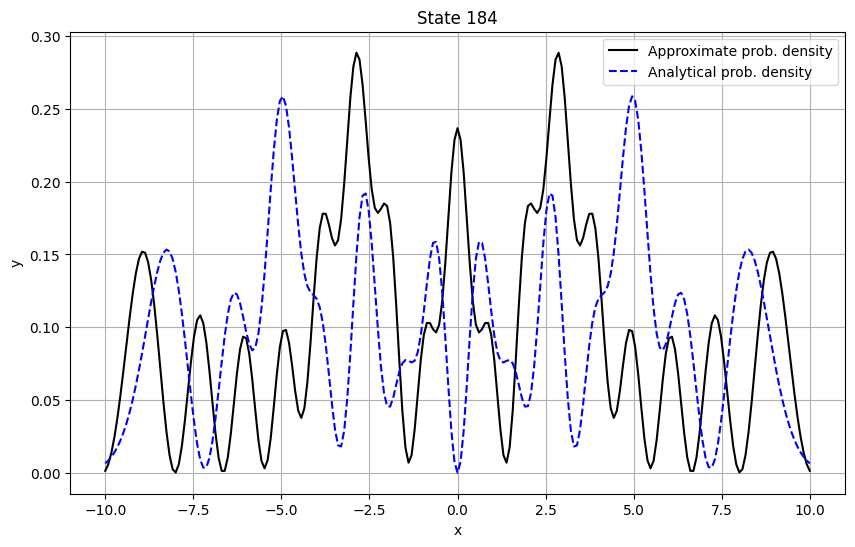

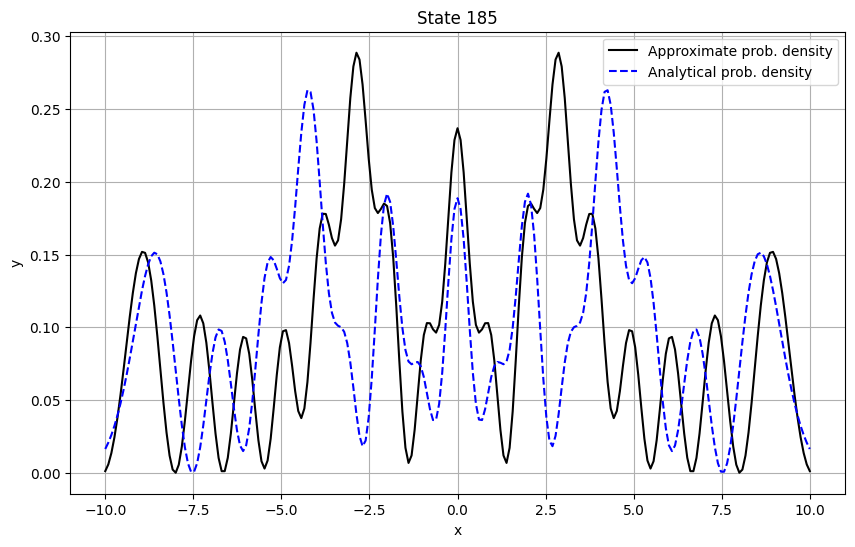

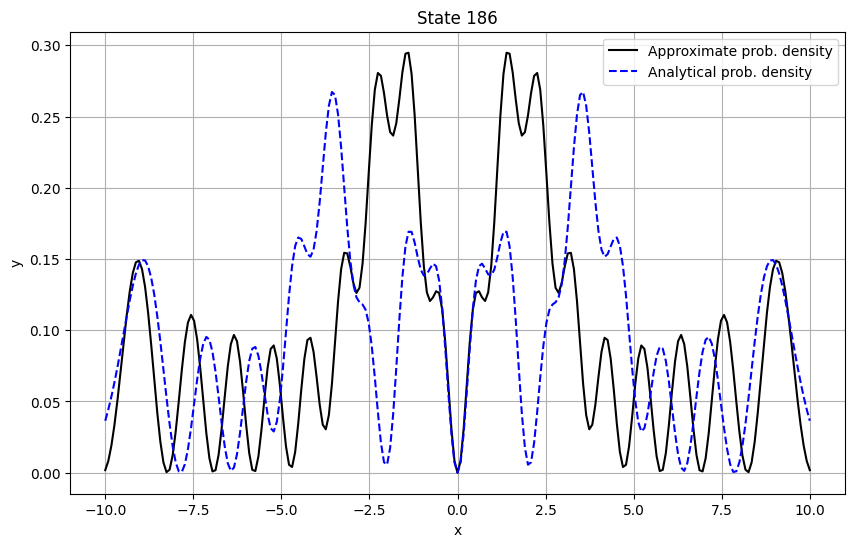

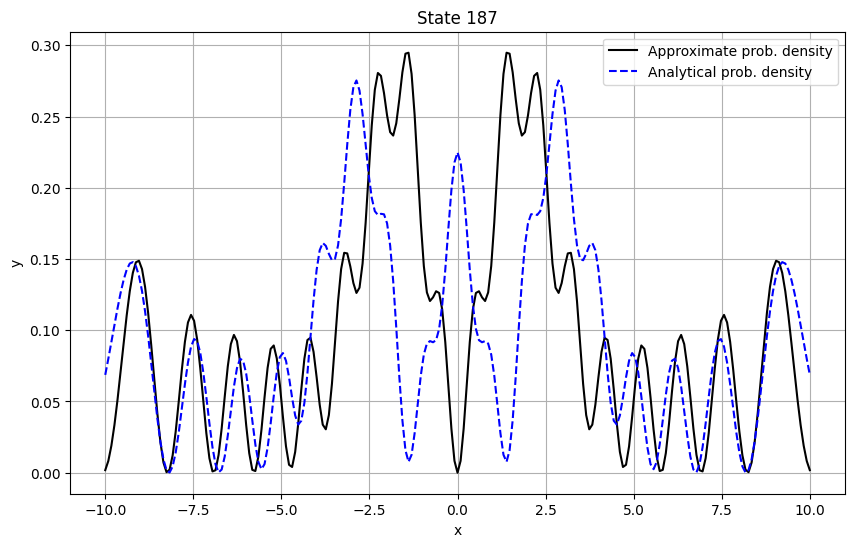

In [7]:
collections_iDEA.analysis.states_density_comparison(iDEA_collection, qho_double, analytic_prob_densities, widget=False)